In [28]:
import os
import numpy as np
from PIL import Image

# Ruta del directorio que contiene todas las imágenes
dataset_dir = r"D:\UNIVERSIDAD\6to Semestre\IA\datasets\Rostros"  # Ajusta esta ruta

# Tamaño al que se redimensionarán las imágenes
img_size = (48, 48)

# Lista para almacenar las imágenes
data = []

# Obtener la lista de todas las imágenes en el directorio
all_images = [img_name for img_name in os.listdir(dataset_dir) if os.path.isfile(os.path.join(dataset_dir, img_name))]

# Seleccionar aleatoriamente 20,000 imágenes
selected_images = np.random.choice(all_images, size=20000, replace=False)

# Procesar solo las imágenes seleccionadas
for img_name in selected_images:
    img_path = os.path.join(dataset_dir, img_name)
    
    try:
        # Abrir la imagen, convertir a RGB, redimensionar y convertir a un array numpy
        img = Image.open(img_path).convert('RGB')
        img = img.resize(img_size)
        img_array = np.array(img)
        
        # Añadir la imagen procesada a la lista
        data.append(img_array)
    except Exception as e:
        print(f"No se pudo procesar la imagen {img_path}: {e}")

# Convertir la lista a un array numpy
data = np.array(data)

# Verificar las dimensiones del dataset
print(f"Dimensiones de los datos: {data.shape}")  # Esto debería mostrar (20000, 48, 48, 3)


Dimensiones de los datos: (20000, 48, 48, 3)


In [29]:
# Aplanar las imágenes y normalizar los datos
n_samples = data.shape[0]  # Número de muestras
data_flattened = data.reshape(n_samples, -1)  # Aplanamos las imágenes (n_imágenes, 48*48*3)
data_normalized = data_flattened / 255.0  # Normalizamos los valores de píxeles al rango [0, 1]

# Verificamos las nuevas dimensiones
print(f"Dimensiones de los datos aplanados: {data_flattened.shape}")  # Debería ser (n_imágenes, 6912)
print(f"Primeros datos normalizados: {data_normalized[0][:10]}")  # Mostramos los primeros 10 valores normalizados de la primera imagen

Dimensiones de los datos aplanados: (20000, 6912)
Primeros datos normalizados: [0.47058824 0.59215686 0.32941176 0.39215686 0.50980392 0.27058824
 0.21568627 0.3372549  0.1372549  0.28235294]


Varianza explicada por PCA: [0.22695538 0.07915443]


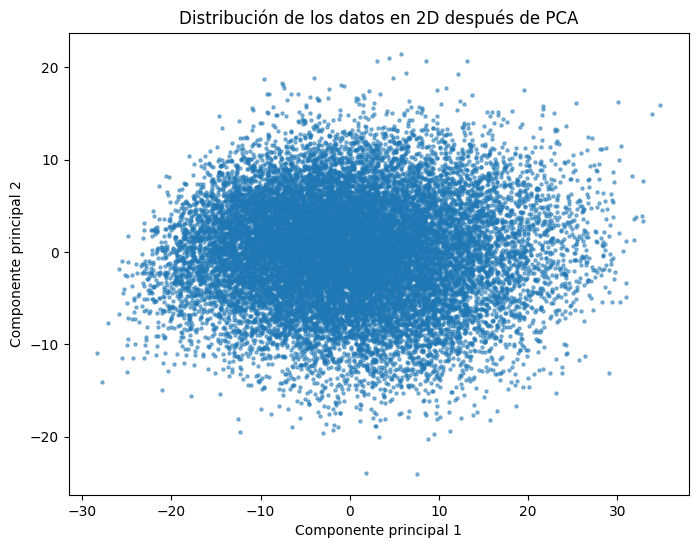

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Asegúrate de que tus datos están normalizados antes de aplicar PCA
# data_normalized es el array con los datos normalizados que creamos anteriormente

# Aplicamos PCA para reducir las dimensiones a 2
pca = PCA(n_components=2)
data_2d = pca.fit_transform(data_normalized)

# Imprimir la varianza explicada por los dos primeros componentes
print(f"Varianza explicada por PCA: {pca.explained_variance_ratio_}")

# Graficamos los datos en 2D
plt.figure(figsize=(8, 6))
plt.scatter(data_2d[:, 0], data_2d[:, 1], s=5, alpha=0.5)
plt.title('Distribución de los datos en 2D después de PCA')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.show()

In [31]:
# Asumimos que data_normalized ya contiene los datos normalizados o data_2d si redujiste las dimensiones.
X = data_normalized  # Si ya has reducido las dimensiones con PCA, usa data_2d en su lugar.

from sklearn.model_selection import train_test_split

# Suponemos que X ya contiene los datos normalizados o dimensionalmente reducidos
# Dividir X en X_train y X_test, asegurando que X_test tenga 2000 datos
X_train, X_test = train_test_split(X, test_size=2000, random_state=42)

# Imprimir las dimensiones de los conjuntos para verificar
print("Dimensiones de X_train:", X_train.shape)
print("Dimensiones de X_test:", X_test.shape)


Dimensiones de X_train: (18000, 6912)
Dimensiones de X_test: (2000, 6912)


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Aplicamos KMeans para diferentes valores de k
kmeans_per_k = [KMeans(n_clusters=k, random_state=42).fit(X_train) for k in range(2, 11)]

# Calculamos el Silhouette Score para cada modelo a partir de k=2
silhouette_scores = [silhouette_score(X_train, model.labels_) for model in kmeans_per_k[1:]]

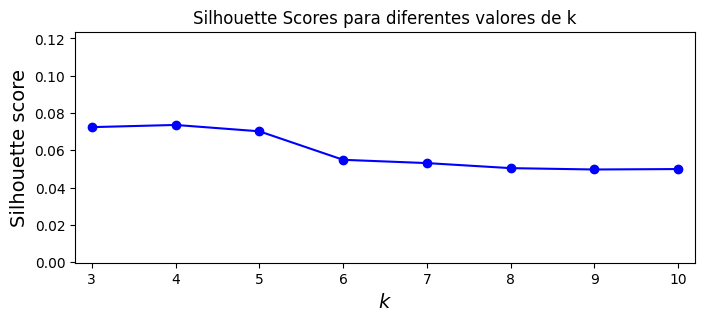

In [33]:
# Graficamos los Silhouette Scores en función de k
plt.figure(figsize=(8, 3))
plt.plot(range(3, 11), silhouette_scores, "bo-")
plt.xlabel("$k$", fontsize=14)
plt.ylabel("Silhouette score", fontsize=14)
plt.title("Silhouette Scores para diferentes valores de k")
plt.axis([2.8, 10.2, min(silhouette_scores)-0.05, max(silhouette_scores)+0.05])
plt.show()

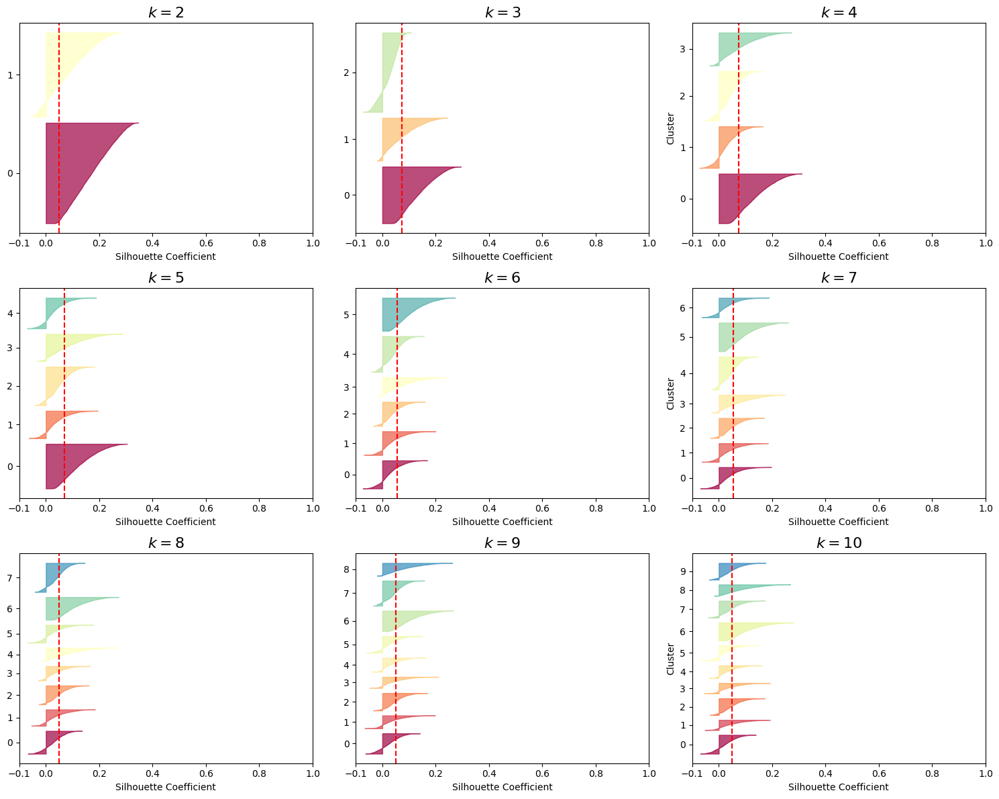

In [35]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt

# Asegúrate de que kmeans_per_k y silhouette_scores están previamente calculados
# X es el conjunto de datos normalizados

plt.figure(figsize=(15, 12))  # Ajustar el tamaño de la figura para más gráficos

# Iterar sobre k de 2 a 10
for k in range(2, 11):
    plt.subplot(3, 3, k - 1)  # Crear una grilla de 3x3 para gráficos
    
    # Predecimos los clusters con el modelo KMeans
    y_pred = kmeans_per_k[k - 2].labels_  # Recuerda que kmeans_per_k empieza en k=2
    
    # Calculamos los coeficientes de silhouette para cada punto
    silhouette_coefficients = silhouette_samples(X_train, y_pred)

    # Agregamos espacio de padding para la visualización
    padding = len(X_train) // 30
    pos = padding
    ticks = []
    
    for i in range(k):  # Iterar sobre cada cluster
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()  # Ordenar los coeficientes para graficar correctamente

        # Seleccionamos un color diferente para cada cluster
        color = mpl.cm.Spectral(i / k)
        
        # Graficamos los coeficientes del cluster correspondiente
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        
        ticks.append(pos + len(coeffs) // 2)  # Ubicar los ticks en el gráfico
        pos += len(coeffs) + padding

    # Ajustar el eje y con los ticks de los clusters
    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    
    # Etiquetas de los ejes y configuración del gráfico
    if k % 3 == 1:
        plt.ylabel("Cluster")
    
    if k >= 0:
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=False)

    # Línea vertical roja para el promedio del Silhouette Score
    plt.axvline(x=silhouette_scores[k - 3], color="red", linestyle="--")
    plt.title(f"$k={k}$", fontsize=16)

plt.tight_layout()
plt.show()


In [49]:
from sklearn.metrics import silhouette_score
# Iterar sobre k de 2 a 10
for k in range(2, 11):
    
    # Predecimos los clusters con el modelo KMeans
    y_pred = kmeans_per_k[k - 2].labels_  # Recuerda que kmeans_per_k empieza en k=2
    
    # Calculamos el Silhouette Score global para k clusters
    score = silhouette_score(X_train, y_pred)
    
    # Imprimimos el Silhouette Score para k
    print(f"Silhouette score global para k={k}: {score:.3f}")


Silhouette score global para k=2: 0.134
Silhouette score global para k=3: 0.072
Silhouette score global para k=4: 0.074
Silhouette score global para k=5: 0.070
Silhouette score global para k=6: 0.055
Silhouette score global para k=7: 0.053
Silhouette score global para k=8: 0.050
Silhouette score global para k=9: 0.050
Silhouette score global para k=10: 0.050


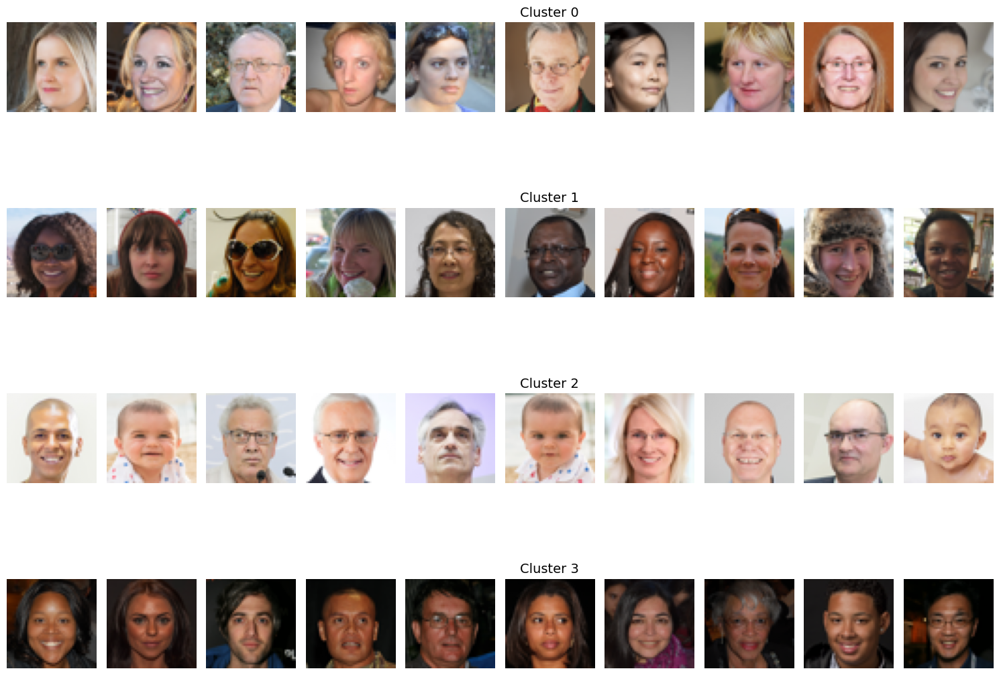

In [54]:
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
import matplotlib.pyplot as plt

def obtener_imagenes_representativas_por_cluster(X_train, K, n_imagenes=5, img_shape=(48, 48, 3)):
    """
    Función para obtener las imágenes más representativas de cada cluster en un modelo KMeans con K clusters.
    
    Parámetros:
    - X: Datos aplanados.
    - K: Número de clusters (valor de K).
    - n_imagenes: Número de imágenes representativas a obtener por cluster.
    - img_shape: Dimensiones de la imagen (ancho, alto, canales).
    """
    # Entrenamos el modelo KMeans
    kmeans = KMeans(n_clusters=K, init="random", random_state=11).fit(X_train)
    y_pred = kmeans.labels_
    
    # Calcular los silhouette coefficients para cada punto
    silhouette_coefficients = silhouette_samples(X_train, y_pred)
    
    # Diccionario para almacenar las imágenes representativas de cada cluster
    imagenes_representativas_por_cluster = {}
    
    for cluster_id in range(K):
        # Obtener los silhouette scores y los índices de los puntos del cluster específico
        cluster_silhouette = silhouette_coefficients[y_pred == cluster_id]
        cluster_indices = np.where(y_pred == cluster_id)[0]
        
        # Ordenar los índices por los silhouette scores (de mayor a menor)
        sorted_indices = cluster_indices[np.argsort(cluster_silhouette)[::-1]]
        
        # Seleccionar las primeras n imágenes más representativas para el cluster actual
        imagenes_representativas = X_train[sorted_indices[:10]]
        imagenes_representativas_por_cluster[cluster_id] = imagenes_representativas
    
    return imagenes_representativas_por_cluster, kmeans

def imprimir_imagenes_por_cluster(imagenes_por_cluster, img_shape=(48, 48, 3)):
    """
    Función para imprimir las imágenes representativas de cada cluster.
    
    Parámetros:
    - imagenes_por_cluster: Diccionario con las imágenes representativas de cada cluster.
    - img_shape: Dimensiones de la imagen (ancho, alto, canales).
    """
    num_clusters = len(imagenes_por_cluster)
    plt.figure(figsize=(15, num_clusters * 3))
    
    # Iterar sobre cada cluster y sus imágenes representativas
    for cluster_id, imagenes in imagenes_por_cluster.items():
        for i, img_flat in enumerate(imagenes):
            img = img_flat.reshape(img_shape)
            plt.subplot(num_clusters, len(imagenes), cluster_id * len(imagenes) + i + 1)
            plt.imshow(img)
            plt.axis('off')
            if i == len(imagenes) // 2:  # Título en el centro de cada fila
                plt.title(f"Cluster {cluster_id}", fontsize=14)
    
    plt.tight_layout()
    plt.show()

# Ejemplo de uso
# X es el dataset aplanado en formato 9700 x 6912

K = 4  # Especifica el número de clusters
imagenes_por_cluster, kmeans = obtener_imagenes_representativas_por_cluster(X_train, K, n_imagenes=5)

# Imprimir las imágenes representativas de cada cluster
imprimir_imagenes_por_cluster(imagenes_por_cluster, img_shape=(48, 48, 3))


In [71]:
# Suponiendo que ya tienes tu modelo KMeans entrenado, llamado kmeans
# y que X_test es tu conjunto de imágenes de prueba

# Predecir a qué cluster pertenece cada imagen en X_test
y_pred_test = kmeans.predict(X_test)

# Imprimir los resultados de clasificación
print("Predicciones de clusters para X_test:", y_pred_test)

Predicciones de clusters para X_test: [0 0 0 ... 3 3 0]


array([0, 0, 0, ..., 3, 3, 0], dtype=int32)

In [75]:
# Paso 2: Calcular los puntajes de silueta para todas las imágenes de prueba
import numpy as np

# Paso 1: Separar los índices de X_test en listas de acuerdo a su clase predicha
indices_clase_0 = [i for i, label in enumerate(y_pred_test) if label == 0]
indices_clase_1 = [i for i, label in enumerate(y_pred_test) if label == 1]
indices_clase_2 = [i for i, label in enumerate(y_pred_test) if label == 2]
indices_clase_3 = [i for i, label in enumerate(y_pred_test) if label == 3]

# Paso 2: Encontrar el tamaño mínimo entre las tres clases
min_size = min(len(indices_clase_0), len(indices_clase_1), len(indices_clase_2), len(indices_clase_3))

# Paso 3: Recortar cada lista al tamaño mínimo
indices_clase_0 = indices_clase_0[:min_size]
indices_clase_1 = indices_clase_1[:min_size]
indices_clase_2 = indices_clase_2[:min_size]
indices_clase_3 = indices_clase_3[:min_size]

# Paso 4: Crear la matriz con tres columnas, una para cada clase
matriz_indices = np.column_stack((indices_clase_0, indices_clase_1, indices_clase_2, indices_clase_3))

# Paso 5: Imprimir el tamaño de cada lista después del recorte
print("Tamaño ajustado de indices_clase_0:", len(indices_clase_0))
print("Tamaño ajustado de indices_clase_1:", len(indices_clase_1))
print("Tamaño ajustado de indices_clase_2:", len(indices_clase_2))
print("Tamaño ajustado de indices_clase_2:", len(indices_clase_3))

Tamaño ajustado de indices_clase_0: 381
Tamaño ajustado de indices_clase_1: 381
Tamaño ajustado de indices_clase_2: 381
Tamaño ajustado de indices_clase_2: 381


In [105]:
# Crear listas vacías para los datos balanceados
X_test_balanced = []

# Agregar imágenes de cada clase en orden a X_test_balanced y sus etiquetas correspondientes a y_test_balanced
for clase_id in range(4):
    indices_clase = matriz_indices[:, clase_id]  # Obtener los índices de la clase actual
    X_test_balanced.append(X_test[indices_clase])  # Agregar imágenes de la clase a X_test_balanced

# Convertir las listas a arrays numpy para asegurar compatibilidad
X_test_balanced = np.concatenate(X_test_balanced, axis=0)

# Imprimir el tamaño de los datos balanceados
print("Tamaño de X_test_balanced:", X_test_balanced.shape)

Tamaño de X_test_balanced: (1524, 6912)


In [106]:
# Crear listas vacías para los datos balanceados
X_test_balanced_50 = []

# Agregar las primeras 50 imágenes de cada clase en orden a X_test_balanced_50
for clase_id in range(4):
    indices_clase = matriz_indices[:125, clase_id]  # Obtener los primeros 50 índices de la clase actual
    X_test_balanced_50.append(X_test[indices_clase])  # Agregar las primeras 50 imágenes de la clase a X_test_balanced_50

# Convertir las listas a arrays numpy para asegurar compatibilidad
X_test_balanced_50 = np.concatenate(X_test_balanced_50, axis=0)

# Imprimir el tamaño de los datos balanceados con 50 imágenes por clase
print("Tamaño de X_test_balanced_50:", X_test_balanced_50.shape)

Tamaño de X_test_balanced_50: (500, 6912)


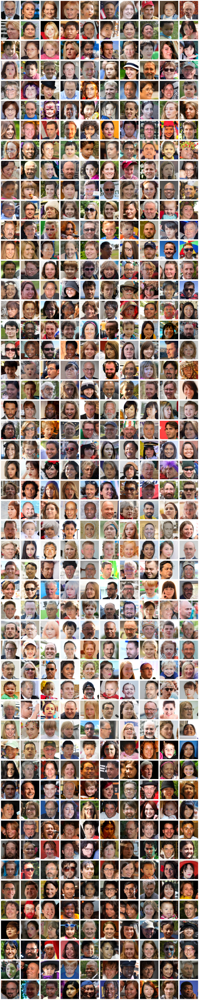

In [108]:
# Definir el número de columnas y calcular las filas necesarias
num_images = X_test_balanced_50.shape[0]
num_columns = 10
num_rows = (num_images // num_columns) + (num_images % num_columns > 0)

# Crear una figura de tamaño ajustable
plt.figure(figsize=(20, num_rows * 2))  # Ajustar el tamaño de la figura

# Iterar sobre cada imagen en X_test_balanced y mostrarla
for index, img in enumerate(X_test_balanced_50):  # Limitar a las primeras 2500 imágenes
    plt.subplot(num_rows, num_columns, index + 1)
    plt.imshow(img.reshape(48, 48, 3))  # Ajustar según el tamaño real de las imágenes
    plt.axis('off')

plt.tight_layout()
plt.show()

In [109]:
y_test = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3]

In [110]:
import numpy as np
from sklearn.cluster import KMeans

# Aplicar KMeans con los datos aplanados
k = 80
kmeans2 = KMeans(n_clusters=k, random_state=11)
X_digits_dist = kmeans2.fit_transform(X_train)
#cluster_labels = kmeans.fit_predict(X)
# Obtener los índices de las imágenes representativas
idxs = np.argmin(X_digits_dist, axis=0)

# Acceder a las imágenes representativas (antes de volver a la forma original)
X_representative_digits = X_train[idxs]  # Ya no usamos `.values`

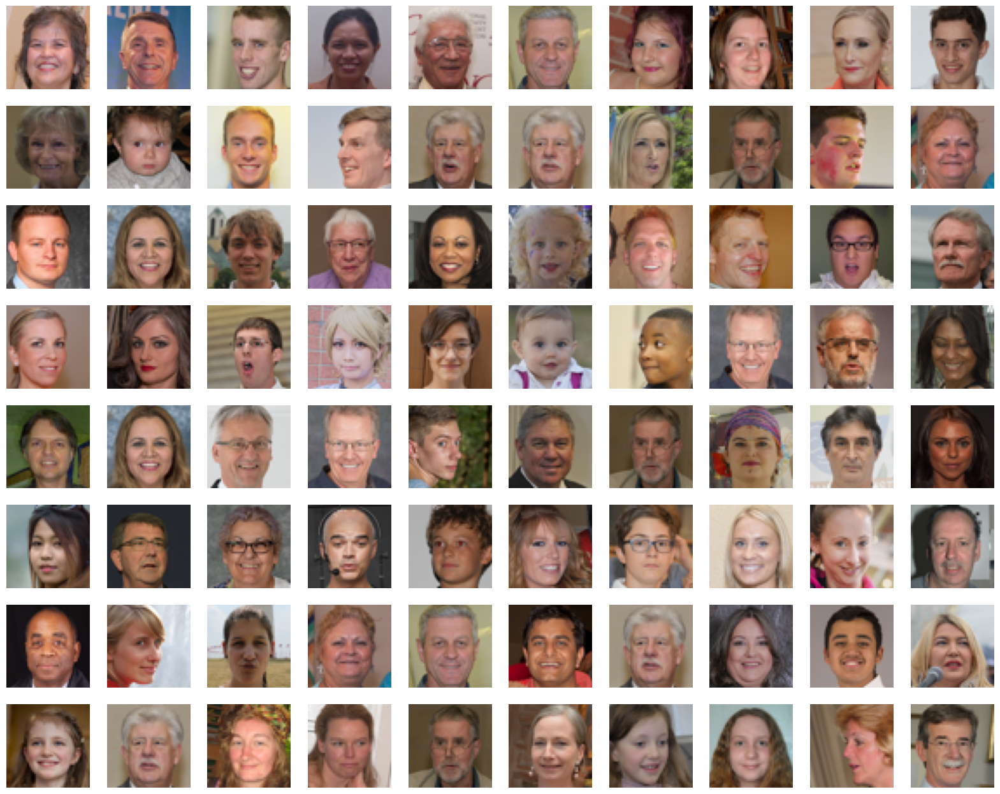

In [113]:
import matplotlib.pyplot as plt

# Visualización de las imágenes normalizadas
plt.figure(figsize=(20, 20))

# Imprimir las primeras 50 imágenes representativas normalizadas
for index, X_representative_digit in enumerate(X_representative_digits[:100]):  # Solo muestra las primeras 50
    plt.subplot(10, 10, index + 1)
    plt.imshow(X_representative_digit.reshape(48, 48, 3))  # Cambiamos a (48, 48, 3)
    plt.axis('off')

plt.show()

In [114]:
y_representative_digits = [1, 0, 2, 1, 2, 2, 3, 3, 2, 2, 3, 3, 2, 2, 1, 2, 1, 3, 0, 0, 0, 1,
       1, 0, 3, 1, 0, 0, 3, 1, 0, 3, 1, 2, 3, 0, 2, 0, 0, 3, 3, 1, 2, 0,
       3, 1, 3, 0, 2, 3, 1, 3, 0, 3, 1, 3, 0, 2, 0, 0, 3, 2, 2, 0, 2, 3,
       2, 3, 1, 2, 3, 2, 0, 2, 3, 0, 0, 1, 0, 0]

In [115]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

log_reg2 = LogisticRegression(multi_class="ovr", solver="lbfgs", max_iter=10000, random_state=42)
%time log_reg2.fit(X_representative_digits, y_representative_digits)
log_reg2.score(X_test_balanced_50, y_test)


d:\UNIVERSIDAD\6to Semestre\IA\PYTHON\env\lib\site-packages\sklearn\linear_model\_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


CPU times: total: 469 ms
Wall time: 782 ms


0.768

In [116]:
y_train_propagated = np.empty(len(X_train))
for i in range(k):
  y_train_propagated[kmeans2.labels_==i] = y_representative_digits[i]

In [117]:
import numpy as np

# Suponiendo que y_train_propagated contiene las etiquetas de las imágenes
# Contar la cantidad de imágenes en cada clase
unique_classes, counts = np.unique(y_train_propagated, return_counts=True)

# Mostrar la cantidad de imágenes por clase
for cls, count in zip(unique_classes, counts):
    print(f"Clase {int(cls)}: {count} imágenes")

Clase 0: 5148 imágenes
Clase 1: 3265 imágenes
Clase 2: 3751 imágenes
Clase 3: 5836 imágenes


In [118]:
# Entrenar el modelo con las muestras seleccionadas
log_reg4 = LogisticRegression(multi_class="ovr", solver="lbfgs", max_iter=10000, random_state=42)
%time log_reg4.fit(X_train, y_train_propagated)

# Evaluar el modelo en el conjunto de prueba
score = log_reg4.score(X_test_balanced_50, y_test)
print(f"Precisión del modelo en el conjunto de prueba: {score:.5f}")

d:\UNIVERSIDAD\6to Semestre\IA\PYTHON\env\lib\site-packages\sklearn\linear_model\_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


CPU times: total: 25min 35s
Wall time: 4min 48s
Precisión del modelo en el conjunto de prueba: 0.73200


In [119]:
# Generar probabilidades y calcular márgenes de incertidumbre
probas = log_reg4.predict_proba(X_train)

# Usar el margen de incertidumbre (diferencia entre las dos probabilidades más altas)
second_largest_proba = np.partition(probas, -2, axis=1)[:, -2]
largest_proba = np.max(probas, axis=1)
margin = largest_proba - second_largest_proba  # Menor margen = más incierto

# Seleccionar las k muestras más inciertas
sorted_ixs = np.argsort(margin)
k = 50  # Ajustar el número de muestras inciertas
X_lowest = X_train[sorted_ixs[:k]]
y_lowest = [y_train_propagated[i] for i in sorted_ixs[:k]]  # Extraer las etiquetas de y_train_propagated en estos índices

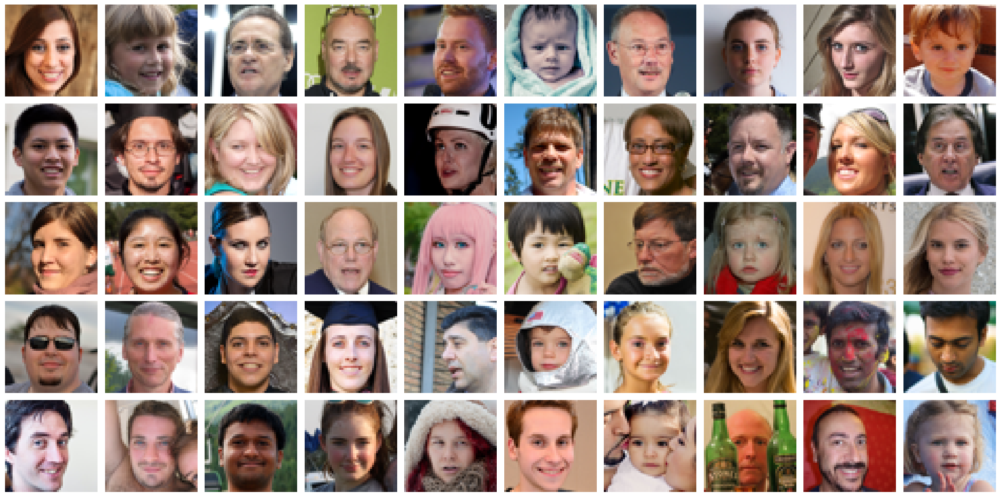

In [121]:
# Definir el número de columnas y calcular las filas necesarias
num_images = X_lowest.shape[0]
num_columns = 10
num_rows = (num_images // num_columns) + (num_images % num_columns > 0)

# Crear una figura de tamaño ajustable
plt.figure(figsize=(20, num_rows * 2))  # Ajustar el tamaño de la figura

# Iterar sobre cada imagen en X_lowest y mostrarla
for index, img in enumerate(X_lowest):  # Limitar a las primeras 2500 imágenes
    plt.subplot(num_rows, num_columns, index + 1)
    plt.imshow(img.reshape(48, 48, 3))  # Ajustar según el tamaño real de las imágenes
    plt.axis('off')

plt.tight_layout()
plt.show()

In [122]:
# Paso 7: Actualizar las etiquetas de las imágenes más inciertas
# En un escenario real, aquí se podría hacer la corrección manual de las etiquetas
y_train2 = [0, 0, 2, 0, 3, 2, 0, 2, 0, 1, 1, 3, 0, 2, 3, 1, 1, 3, 0, 3, 0, 0,
       3, 0, 2, 0, 1, 3, 2, 2, 1, 0, 1, 0, 2, 2, 2, 3, 1, 1, 2, 1, 1, 1,
       1, 0, 2, 1, 3, 2]
y_train_AC = y_train_propagated.copy()
y_train_AC[sorted_ixs[:k]] = y_train2

In [123]:
# Reentrenar el modelo
log_reg5 = LogisticRegression(solver="lbfgs", max_iter=10000, random_state=42)
log_reg5.fit(X_train, y_train_propagated)

# Evaluar el modelo después de aplicar aprendizaje activo
score = log_reg5.score(X_test_balanced_50, y_test)
print(f"Precisión del modelo después de aplicar aprendizaje activo con márgenes de incertidumbre: {score}")

Precisión del modelo después de aplicar aprendizaje activo con márgenes de incertidumbre: 0.768
